In [1]:
import msprime
import numpy as np  # Importing NumPy for numerical operations
import os  # Importing os for operating system functionalities
import argparse  # Importing argparse for command-line argument parsing
import pandas as pd  # Importing pandas for DataFrame manipulation
import zipfile  # Importing zipfile for creating zip archives
import gzip
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import tskit as ts
import itertools


Load Simulated data

In [3]:

trees_file_sim_beta_const = ts.load("/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/input_vcfs_ts_mhsf/forsmbc_beta_3haps_10Mb/const_size/beta/m1e-06/alpha1.7/Beta_rep0_m1e-06_ratio0.1_rs152423716.ts")
trees_file_sim_kingman_const= ts.load("/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/Sims_for_eSMC_SMBC/input_vcfs_ts_mhsf/kingaman_8haps_10Mb/kingman/constpop/kingman/m1e-06/Kingman_rep0_m1e-06_ratio0.1_rs152423716.ts")

In [4]:
trees_file_sim_beta_const.draw_svg()

The beta trees are load as coalscent trees with very close times

Beta Inferred examine

In [25]:
Beta_inf=ts.load("/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/BetaCoal_Const_rep0_m1e-07_r5e-08_rs6.25/BetaCoal_Const_rep0_m1e-07_r5e-08_rs6.25_singerout_1.trees")
Beta_inf

Kingman Inferred examine

In [26]:
Kingman_inf=ts.load("/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/KingmanConst_const_rep0_m1e-07_r5e-08_rs9.0/KingmanConst_const_rep0_m1e-07_r5e-08_rs9.0_singerout_0.trees")
Kingman_inf

Total time to most recent common ancester

In [23]:
def compute_pairwise_coalescence_times(trees):
    kb = [0]  # Starting genomic position
    mrca_time = []
    for tree in trees.trees():
        kb.append(tree.interval.right/1000)  # convert to kb
        mrca = trees.node(tree.root)  # For msprime tree sequences, the root node is the MRCA
        mrca_time.append(mrca.time)
        
    plt.stairs(mrca_time, kb, baseline=None)
    plt.xlabel("Genome position (kb)")
    plt.ylabel("Time of root (or MRCA) in generations")
    plt.yscale("log")
    plt.show()

    return mrca_time, kb

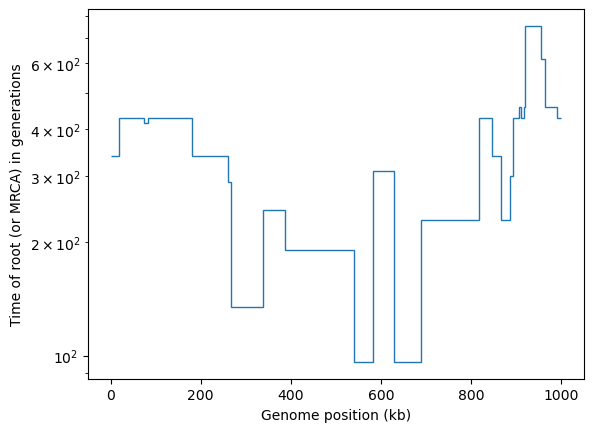

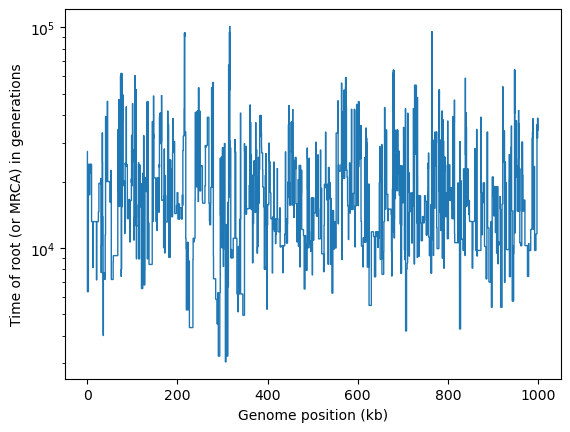

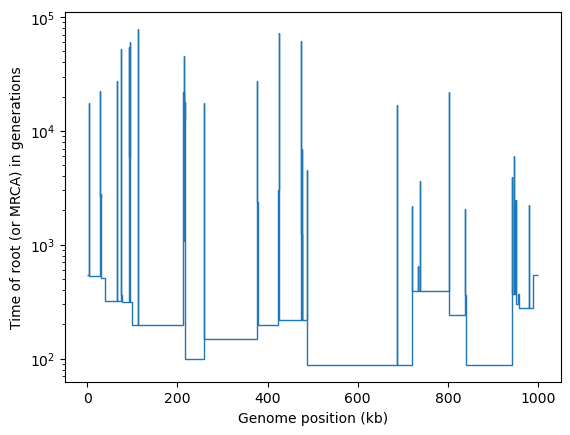

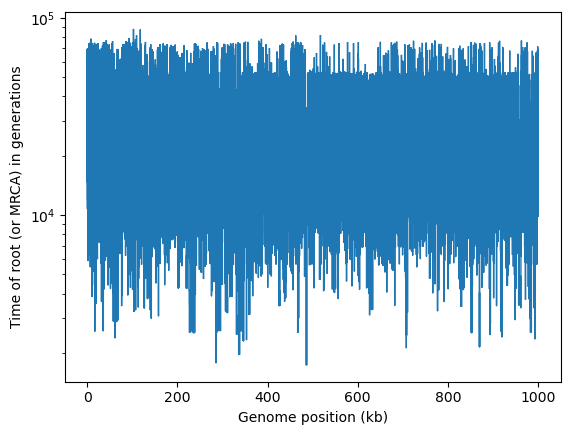

In [27]:
beta_sim_tmrca, kb=compute_pairwise_coalescence_times(trees_file_sim_beta_const)
kingman_sim_tmrca,_=compute_pairwise_coalescence_times(trees_file_sim_kingman_const)
beta_inf_tmrca,_=compute_pairwise_coalescence_times(Beta_inf)
kingman_inf_tmrca,_=compute_pairwise_coalescence_times(Kingman_inf)


In [127]:
import numpy as np
import tskit as ts
import os


def compute_all_coalescence_times(trees):
    # This function should be implemented to compute pairwise coalescence times
    # It should return a numpy array with two columns: position and coalescence time
    # Example implementation:
    kb = [0]  # Starting genomic position
    mrca_time = []
    for tree in trees.trees():
        kb.append(tree.interval.right/1000)  # convert to kb
        mrca = trees.node(tree.root)  # For msprime tree sequences, the root node is the MRCA
        mrca_time.append((tree.interval[0], mrca.time))
    return np.array(mrca_time)

def calculate_windowed_tmrca(all_tot_coalescence_times, sequence_length, window_size, overlap):
    step_size = window_size - overlap
    num_windows = int((sequence_length - overlap) / step_size)
    windowed_tmrca = []

    for i in range(num_windows):
        start = i * step_size
        end = start + window_size
        window_indices = np.where((all_tot_coalescence_times[:, 0] >= start) & (all_tot_coalescence_times[:, 0] < end))[0]
        
        if len(window_indices) > 0:
            window_tmrca = np.mean(all_tot_coalescence_times[window_indices, 1])
        else:
            window_tmrca = np.nan  # or some other placeholder value
        
        windowed_tmrca.append((start, end, window_tmrca))
    
    return windowed_tmrca

def process_tree_files(folder):
    all_tmrca_list = []  # Store windowed TMRCA values for pairwise trees
    tree_files = [f for f in os.listdir(folder) if f.endswith('.trees')]  # Filter for .trees files
    
    for tree_file in tree_files:
        ts_inf = ts.load(os.path.join(folder, tree_file))
        
        # Compute  coalescence times for this tree
        All_total_coalescence_times = compute_all_coalescence_times(ts_inf)
        
        # Calculate windowed mean  TMRCA
        all_tmrca_list.append(All_total_coalescence_times)
    
    return all_tmrca_list

def process_tree_files_windowed(folder, window_size=1, overlap=0):
    all_windowed_tmrca_list = []  # Store windowed TMRCA values for all trees
    tree_files = [f for f in os.listdir(folder) if f.endswith('.trees')]  # Filter for .trees files
    
    for tree_file in tree_files:
        ts_inf = ts.load(os.path.join(folder, tree_file))
        
        # Compute  coalescence times for this tree
        all_tot_coalescence_times = compute_all_coalescence_times(ts_inf)
        
        # Calculate windowed mean pairwise TMRCA
        windowed_tmrca = calculate_windowed_tmrca(all_tot_coalescence_times, ts_inf.sequence_length, window_size, overlap)
        all_windowed_tmrca_list.append(windowed_tmrca)
    
    return all_windowed_tmrca_list


Beta_tmrca_across_simulated_trees= process_tree_files(folder='')
Kingman_tmrca_across_simulated_trees= process_tree_files(folder='')
Beta_tmrca_across_inferred_trees= process_tree_files(folder='/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/BetaCoal_Const_rep0_m1e-07_r5e-08_rs6.25')
Kingman_tmrca_across_inferred_trees= process_tree_files(folder='/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/KingmanConst_const_rep0_m1e-07_r5e-08_rs9.0')


TMRCA along chromosome simulation trees

TMRCA along chromosome inferred trees

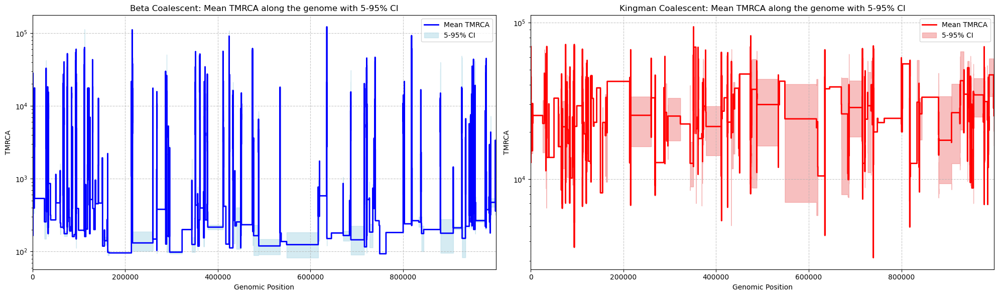

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Combine all Inferred trees' data
all_positions = np.concatenate([tree[:, 0] for tree in Beta_tmrca_across_inferred_trees])
Beta_all_tmrca = np.concatenate([tree[:, 1] for tree in Beta_tmrca_across_inferred_trees])
Kingman_all_tmrca = np.concatenate([tree[:, 1] for tree in Kingman_tmrca_across_inferred_trees])

# Sort the combined data by position
sort_indices = np.argsort(all_positions)
sorted_positions = all_positions[sort_indices]
Beta_sorted_tmrca = Beta_all_tmrca[sort_indices]
Kingman_sorted_tmrca = Kingman_all_tmrca[sort_indices]

# Calculate mean TMRCA
unique_positions, indices = np.unique(sorted_positions, return_inverse=True)
Beta_mean_tmrca = np.bincount(indices, weights=Beta_sorted_tmrca) / np.bincount(indices)
Kingman_mean_tmrca = np.bincount(indices, weights=Kingman_sorted_tmrca) / np.bincount(indices)

# Calculate 5th and 95th percentiles
Beta_percentile_5 = np.array([np.percentile(Beta_sorted_tmrca[indices == i], 5) for i in range(len(unique_positions))])
Beta_percentile_95 = np.array([np.percentile(Beta_sorted_tmrca[indices == i], 95) for i in range(len(unique_positions))])
Kingman_percentile_5 = np.array([np.percentile(Kingman_sorted_tmrca[indices == i], 5) for i in range(len(unique_positions))])
Kingman_percentile_95 = np.array([np.percentile(Kingman_sorted_tmrca[indices == i], 95) for i in range(len(unique_positions))])

# Create the plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Beta Coalescent Plot
ax1.step(unique_positions, Beta_mean_tmrca, where='post', color='blue', linewidth=2, label='Mean TMRCA')
ax1.fill_between(unique_positions, Beta_percentile_5, Beta_percentile_95, color='lightblue', alpha=0.5, label='5-95% CI', step='post')
ax1.set_xlabel('Genomic Position')
ax1.set_ylabel('TMRCA')
ax1.set_title('Beta Coalescent: Mean TMRCA along the genome with 5-95% CI')
ax1.set_yscale("log")
ax1.set_xlim(unique_positions[0], unique_positions[-1])
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.legend()

# Kingman Coalescent Plot
ax2.step(unique_positions, Kingman_mean_tmrca, where='post', color='blue', linewidth=2, label='Mean TMRCA')
ax2.fill_between(unique_positions, Kingman_percentile_5, Kingman_percentile_95, color='lightblue', alpha=0.5, label='5-95% CI', step='post')
ax2.set_xlabel('Genomic Position')
ax2.set_ylabel('TMRCA')
ax2.set_yscale("log")
ax2.set_title('Kingman Coalescent: Mean TMRCA along the genome with 5-95% CI')
ax2.set_xlim(unique_positions[0], unique_positions[-1])
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Process Beta coalescent data
Beta_all_positions = np.concatenate([tree[:, 0] for tree in Beta_tmrca_across_inferred_trees])
Beta_all_tmrca = np.concatenate([tree[:, 1] for tree in Beta_tmrca_across_inferred_trees])

Beta_sort_indices = np.argsort(Beta_all_positions)
Beta_sorted_positions = Beta_all_positions[Beta_sort_indices]
Beta_sorted_tmrca = Beta_all_tmrca[Beta_sort_indices]

Beta_unique_positions, Beta_indices = np.unique(Beta_sorted_positions, return_inverse=True)
Beta_mean_tmrca = np.bincount(Beta_indices, weights=Beta_sorted_tmrca) / np.bincount(Beta_indices)

Beta_percentile_5 = np.array([np.percentile(Beta_sorted_tmrca[Beta_indices == i], 5) for i in range(len(Beta_unique_positions))])
Beta_percentile_95 = np.array([np.percentile(Beta_sorted_tmrca[Beta_indices == i], 95) for i in range(len(Beta_unique_positions))])

# Process Kingman coalescent data
Kingman_all_positions = np.concatenate([tree[:, 0] for tree in Kingman_tmrca_across_inferred_trees])
Kingman_all_tmrca = np.concatenate([tree[:, 1] for tree in Kingman_tmrca_across_inferred_trees])

Kingman_sort_indices = np.argsort(Kingman_all_positions)
Kingman_sorted_positions = Kingman_all_positions[Kingman_sort_indices]
Kingman_sorted_tmrca = Kingman_all_tmrca[Kingman_sort_indices]

Kingman_unique_positions, Kingman_indices = np.unique(Kingman_sorted_positions, return_inverse=True)
Kingman_mean_tmrca = np.bincount(Kingman_indices, weights=Kingman_sorted_tmrca) / np.bincount(Kingman_indices)

Kingman_percentile_5 = np.array([np.percentile(Kingman_sorted_tmrca[Kingman_indices == i], 5) for i in range(len(Kingman_unique_positions))])
Kingman_percentile_95 = np.array([np.percentile(Kingman_sorted_tmrca[Kingman_indices == i], 95) for i in range(len(Kingman_unique_positions))])

# Create the plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Beta Coalescent Plot
ax1.step(Beta_unique_positions, Beta_mean_tmrca, where='post', color='blue', linewidth=2, label='Mean TMRCA')
ax1.fill_between(Beta_unique_positions, Beta_percentile_5, Beta_percentile_95, color='lightblue', alpha=0.5, label='5-95% CI', step='post')
ax1.set_xlabel('Genomic Position')
ax1.set_ylabel('TMRCA')
ax1.set_title('Beta Coalescent: Mean TMRCA along the genome with 5-95% CI')
ax1.set_yscale("log")
ax1.set_xlim(Beta_unique_positions[0], Beta_unique_positions[-1])
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.legend()

# Kingman Coalescent Plot
ax2.step(Kingman_unique_positions, Kingman_mean_tmrca, where='post', color='red', linewidth=2, label='Mean TMRCA')
ax2.fill_between(Kingman_unique_positions, Kingman_percentile_5, Kingman_percentile_95, color='lightcoral', alpha=0.5, label='5-95% CI', step='post')
ax2.set_xlabel('Genomic Position')
ax2.set_ylabel('TMRCA')
ax2.set_yscale("log")
ax2.set_title('Kingman Coalescent: Mean TMRCA along the genome with 5-95% CI')
ax2.set_xlim(Kingman_unique_positions[0], Kingman_unique_positions[-1])
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Process Beta coalescent data
Beta_all_positions = np.concatenate([tree[:, 0] for tree in Beta_tmrca_across_inferred_trees])
Beta_all_tmrca = np.concatenate([tree[:, 1] for tree in Beta_tmrca_across_inferred_trees])

Beta_sort_indices = np.argsort(Beta_all_positions)
Beta_sorted_positions = Beta_all_positions[Beta_sort_indices]
Beta_sorted_tmrca = Beta_all_tmrca[Beta_sort_indices]

Beta_unique_positions, Beta_indices = np.unique(Beta_sorted_positions, return_inverse=True)
Beta_mean_tmrca = np.bincount(Beta_indices, weights=Beta_sorted_tmrca) / np.bincount(Beta_indices)

Beta_percentile_5 = np.array([np.percentile(Beta_sorted_tmrca[Beta_indices == i], 5) for i in range(len(Beta_unique_positions))])
Beta_percentile_95 = np.array([np.percentile(Beta_sorted_tmrca[Beta_indices == i], 95) for i in range(len(Beta_unique_positions))])

# Process Kingman coalescent data
Kingman_all_positions = np.concatenate([tree[:, 0] for tree in Kingman_tmrca_across_inferred_trees])
Kingman_all_tmrca = np.concatenate([tree[:, 1] for tree in Kingman_tmrca_across_inferred_trees])

Kingman_sort_indices = np.argsort(Kingman_all_positions)
Kingman_sorted_positions = Kingman_all_positions[Kingman_sort_indices]
Kingman_sorted_tmrca = Kingman_all_tmrca[Kingman_sort_indices]

Kingman_unique_positions, Kingman_indices = np.unique(Kingman_sorted_positions, return_inverse=True)
Kingman_mean_tmrca = np.bincount(Kingman_indices, weights=Kingman_sorted_tmrca) / np.bincount(Kingman_indices)

Kingman_percentile_5 = np.array([np.percentile(Kingman_sorted_tmrca[Kingman_indices == i], 5) for i in range(len(Kingman_unique_positions))])
Kingman_percentile_95 = np.array([np.percentile(Kingman_sorted_tmrca[Kingman_indices == i], 95) for i in range(len(Kingman_unique_positions))])

# Adjust simulated data to match sorted positions
Beta_sim_sort_indices = np.searchsorted(Beta_unique_positions, kb)
Beta_sim_sorted_tmrca = beta_sim_tmrca[Beta_sim_sort_indices]

Kingman_sim_sort_indices = np.searchsorted(Kingman_unique_positions, kb)
Kingman_sim_sorted_tmrca = kingman_sim_tmrca[Kingman_sim_sort_indices]

# Create the plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Beta Coalescent Plot
ax1.step(Beta_unique_positions, Beta_mean_tmrca, where='post', color='blue', linewidth=2, label='Mean TMRCA (Inferred)')
ax1.fill_between(Beta_unique_positions, Beta_percentile_5, Beta_percentile_95, color='lightblue', alpha=0.5, label='5-95% CI (Inferred)', step='post')
ax1.step(Beta_unique_positions, Beta_sim_sorted_tmrca, where='post', color='red', linewidth=2, label='Simulated TMRCA')
ax1.set_xlabel('Genomic Position')
ax1.set_ylabel('TMRCA')
ax1.set_title('Beta Coalescent: TMRCA along the genome')
ax1.set_yscale("log")
ax1.set_xlim(Beta_unique_positions[0], Beta_unique_positions[-1])
ax1.grid(True, linestyle='--', alpha=0.7)
ax1.legend()

# Kingman Coalescent Plot
ax2.step(Kingman_unique_positions, Kingman_mean_tmrca, where='post', color='blue', linewidth=2, label='Mean TMRCA (Inferred)')
ax2.fill_between(Kingman_unique_positions, Kingman_percentile_5, Kingman_percentile_95, color='lightblue', alpha=0.5, label='5-95% CI (Inferred)', step='post')
ax2.step(Kingman_unique_positions, Kingman_sim_sorted_tmrca, where='post', color='red', linewidth=2, label='Simulated TMRCA')
ax2.set_xlabel('Genomic Position')
ax2.set_ylabel('TMRCA')
ax2.set_yscale("log")
ax2.set_title('Kingman Coalescent: TMRCA along the genome')
ax2.set_xlim(Kingman_unique_positions[0], Kingman_unique_positions[-1])
ax2.grid(True, linestyle='--', alpha=0.7)
ax2.legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

KeyboardInterrupt: 

Extract all TMRCAs from all inferred trees for distribution plot

In [140]:

# Extract the second column (index 1) from each list
beta_tmrca = [tree_tmrca[:,1] for tree_tmrca in Beta_tmrca_across_inferred_trees]

# Concatenate and flatten
flat_Inf_Beta_all_tmrca = np.concatenate(beta_tmrca).flatten()

# Extract the second column (index 1) from each list
kingman_tmrca = [tree_tmrca[:,1] for tree_tmrca in Kingman_tmrca_across_inferred_trees]

# Concatenate and flatten
flat_Inf_kingman_all_tmrca = np.concatenate(kingman_tmrca).flatten()

In [138]:
# Ensure all data is in numpy array format
Kingman_Sim_all_tmrca = np.array(kingman_sim_tmrca)
Beta_Sim_all_tmrca = np.array(beta_sim_tmrca)

len(Beta_Sim_all_tmrca)

51

2228

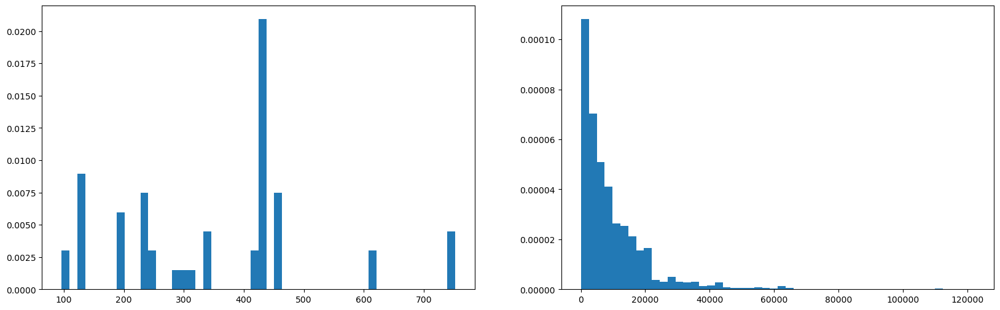

In [142]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

ax1.hist(Beta_Sim_all_tmrca, bins=50, alpha=0.99, label="Simulated", density=True)
ax2.hist(flat_Inf_Beta_all_tmrca, bins=50, alpha=0.99, label="Simulated", density=True)

len(flat_Inf_Beta_all_tmrca)

[  1444.81357151   3484.13985148   5523.46613144   7562.79241141
   9602.11869138  11641.44497135  13680.77125132  15720.09753129
  17759.42381125  19798.75009122  21838.07637119  23877.40265116
  25916.72893113  27956.0552111   29995.38149107  32034.70777103
  34074.034051    36113.36033097  38152.68661094  40192.01289091
  42231.33917088  44270.66545084  46309.99173081  48349.31801078
  50388.64429075  52427.97057072  54467.29685069  56506.62313066
  58545.94941062  60585.27569059  62624.60197056  64663.92825053
  66703.2545305   68742.58081047  70781.90709043  72821.2333704
  74860.55965037  76899.88593034  78939.21221031  80978.53849028
  83017.86477025  85057.19105021  87096.51733018  89135.84361015
  91175.16989012  93214.49617009  95253.82245006  97293.14873002
  99332.47500999 101371.80128996]

Kingman TMRCA:
Simulated:
Mean: 20991.15
Median: 17717.21
Standard Deviation: 12425.53

Inferred:
Mean: 24379.48
Median: 22595.03
Standard Deviation: 11895.83
[7.79887124e+01 2.56996306e

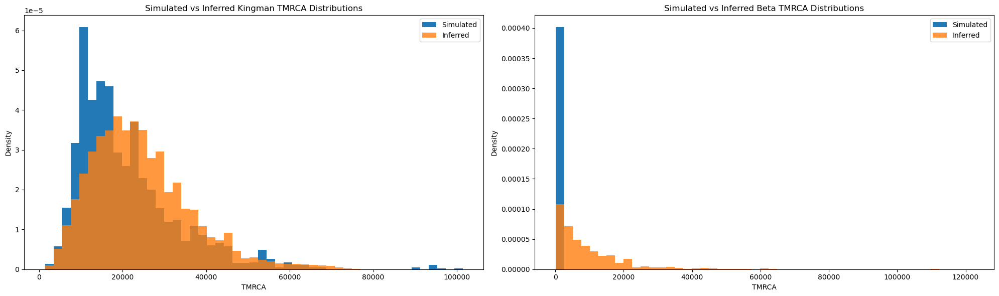

In [44]:

# Create the figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Function to plot histogram and print statistics
def plot_and_print_stats(ax, sim_data, inf_data, title):
    min_val = min(sim_data.min(), inf_data.min())
    max_val = max(sim_data.max(), inf_data.max())
    bins = np.linspace(min_val, max_val, 50)
    print(bins)
    ax.hist(sim_data, bins=bins, alpha=0.99, label="Simulated", density=True)
    ax.hist(inf_data, bins=bins, alpha=0.8, label="Inferred", density=True)
    
    ax.set_title(f"Simulated vs Inferred {title} TMRCA Distributions")
    ax.set_xlabel("TMRCA")
    ax.set_ylabel("Density")
   # ax.set_xlim(0,40000)
    ax.legend()
    
    print(f"\n{title} TMRCA:")
    print("Simulated:")
    print(f"Mean: {np.mean(sim_data):.2f}")
    print(f"Median: {np.median(sim_data):.2f}")
    print(f"Standard Deviation: {np.std(sim_data):.2f}")
    print("\nInferred:")
    print(f"Mean: {np.mean(inf_data):.2f}")
    print(f"Median: {np.median(inf_data):.2f}")
    print(f"Standard Deviation: {np.std(inf_data):.2f}")

# Plot Kingman coalescent
plot_and_print_stats(ax1, Kingman_Sim_all_tmrca, Kingman_flattened_tmrca, "Kingman")

# Plot Beta coalescent
plot_and_print_stats(ax2, Beta_Sim_all_tmrca, Beta_flattened_tmrca, "Beta")

plt.tight_layout()
plt.show()

Compute Pairwise time to most recent common ancester

In [76]:
def compute_pairwise_coalescence_time(ts, leaf_index1, leaf_index2, s):
    windows = np.arange(0, ts.sequence_length, s)
    windows = np.append(windows, ts.sequence_length)
    
    # Compute pairwise diversity (this gives branch length for pairwise coalescence)
    times = ts.diversity(sample_sets=[leaf_index1, leaf_index2], windows=windows, mode='branch') / 2
    
    return times

def compute_pairwise_coalescence_times(ts, s):
    windows = np.arange(0, ts.sequence_length, s)
    n = len(windows)
    pairs = list(itertools.combinations(ts.samples(), 2))  # All unique pairs of samples
    m = len(pairs)
    
    # Initialize the array to store all coalescence times
    pairwise_coalescence_times = np.zeros((n, m))
    
    # Compute coalescence time for each pair
    for index, (leaf_index1, leaf_index2) in enumerate(pairs):
        #print(f"Computing pair: {leaf_index1}, {leaf_index2}")
        pairwise_coalescence_times[:, index] = compute_pairwise_coalescence_time(ts, leaf_index1, leaf_index2, s)
    
    return pairwise_coalescence_times, pairs


In [77]:
interval_size = 10000
    
# Compute pairwise coalescence times for Beta coalescent
pairwise_coalescence_times_Beta_simulated, pairs_beta = compute_pairwise_coalescence_times(trees_file_sim_beta_const, interval_size)
print("Beta coalescent shape:", pairwise_coalescence_times_Beta_simulated.shape)

# Compute pairwise coalescence times for Kingman coalescent
pairwise_coalescence_times_Kingman_simulated, pairs_kingman = compute_pairwise_coalescence_times(trees_file_sim_kingman_const, interval_size)
print("Kingman coalescent shape:", pairwise_coalescence_times_Kingman_simulated.shape)

Beta coalescent shape: (100, 45)
Kingman coalescent shape: (100, 45)


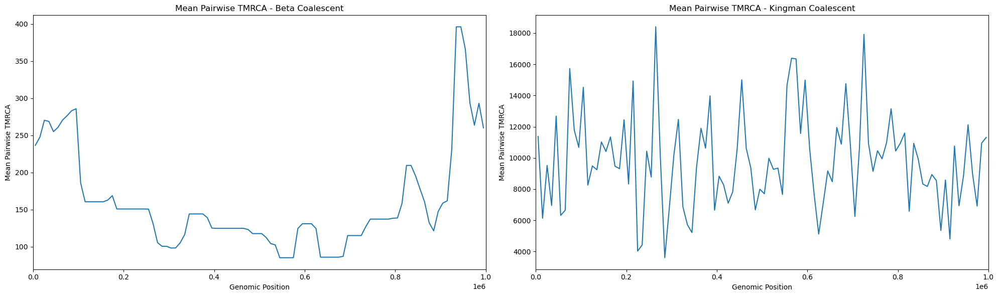

In [68]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

# Analysis 1: Mean Pairwise TMRCA Across the Genome
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

for ax, pairwise_coalescence_times, ts_file, title in zip(
    [ax1, ax2],
    [pairwise_coalescence_times_Beta_simulated, pairwise_coalescence_times_Kingman_simulated],
    [trees_file_sim_beta_const, trees_file_sim_kingman_const],
    ['Beta Coalescent', 'Kingman Coalescent']
):
    mean_tmrca = np.mean(pairwise_coalescence_times, axis=1)
    window_midpoints = np.arange(interval_size/2, ts_file.sequence_length, interval_size)
    ax.plot(window_midpoints, mean_tmrca)
    ax.set_title(f'Mean Pairwise TMRCA - {title}')
    ax.set_xlabel('Genomic Position')
    ax.set_ylabel('Mean Pairwise TMRCA')
    ax.set_xlim(0, ts_file.sequence_length)

plt.tight_layout()
plt.show()



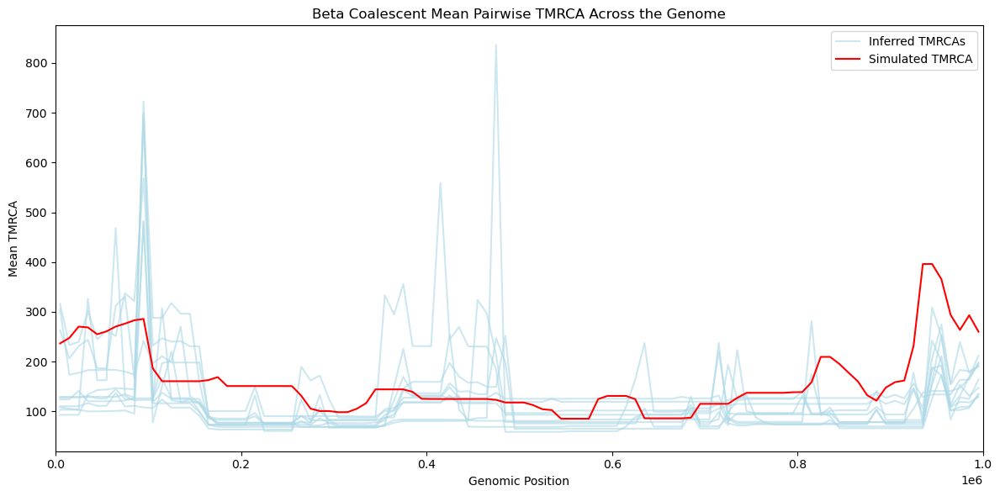

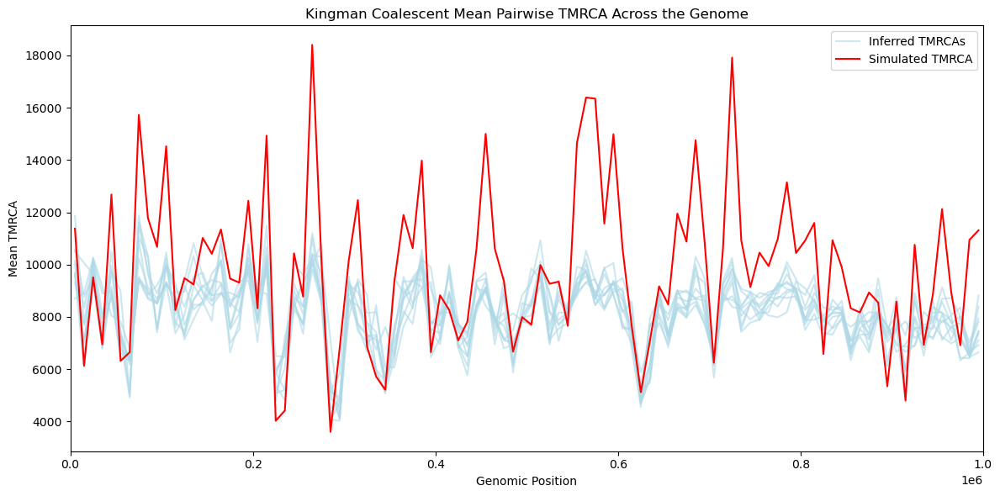

In [84]:


def process_tree_files_pairwise(folder, interval_size=10000):
    pairwise_mean_tmrca_list = []  # Store mean TMRCA values for all trees
    tree_files = [f for f in os.listdir(folder) if f.endswith('.trees')]  # Filter for .trees files
    
    for tree_file in tree_files:
        ts_inf = ts.load(os.path.join(folder, tree_file))
        
        # Compute pairwise coalescence times for this tree
        pairwise_coalescence_times, pairs = compute_pairwise_coalescence_times(ts_inf, interval_size)
        
        # Calculate mean pairwise TMRCA for each window
        mean_tmrca = np.mean(pairwise_coalescence_times, axis=1)
        pairwise_mean_tmrca_list.append(mean_tmrca)
    
    return pairwise_mean_tmrca_list, ts_inf.sequence_length

def plot_tmrca_cloud(pairwise_mean_tmrca_inferred_list, sequence_length, pairwise_coalescence_times_simulated, model, interval_size=10000):
    # Create x-axis values (midpoints of windows)
    window_midpoints = np.arange(interval_size/2, sequence_length, interval_size)
    
    # Plot mean pairwise TMRCA across the genome as a translucent cloud
    plt.figure(figsize=(12, 6))
    
    # Plot inferred TMRCAs
    for i, mean_tmrca in enumerate(pairwise_mean_tmrca_inferred_list):
        if i == 0:
            plt.plot(window_midpoints, mean_tmrca, alpha=0.6, color='lightblue', label='Inferred TMRCAs')
        else:
            plt.plot(window_midpoints, mean_tmrca, alpha=0.6, color='lightblue')
    
    # Plot the mean of all trees (simulated TMRCA)
    if model.lower() == 'beta':
        mean_pairwise_tmrca_simulated = np.mean(pairwise_coalescence_times_simulated, axis=1)
        title = 'Beta Coalescent Mean Pairwise TMRCA Across the Genome'
    elif model.lower() == 'kingman':
        mean_pairwise_tmrca_simulated = np.mean(pairwise_coalescence_times_simulated, axis=1)
        title = 'Kingman Coalescent Mean Pairwise TMRCA Across the Genome'
    else:
        raise ValueError("Model must be either 'beta' or 'kingman'")
    
    plt.plot(window_midpoints, mean_pairwise_tmrca_simulated, color='red', label='Simulated TMRCA')
    
    plt.title(title)
    plt.xlabel('Genomic Position')
    plt.ylabel('Mean TMRCA')
    plt.xlim(0, sequence_length)
    
    # Add legend
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Load simulated tree sequences
trees_file_sim_beta_const = ts.load("/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/inputs/BetaCoal_Const_rep0_m1e-07_r5e-08_rs6.25.ts")
trees_file_sim_kingman_const = ts.load("/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/inputs/KingmanConst_const_rep0_m1e-07_r5e-08_rs9.0.ts")

interval_size = 10000

# Compute pairwise coalescence times for simulated data
Beta_pairwise_coalescence_times_Sim,pairs_beta = compute_pairwise_coalescence_times(trees_file_sim_beta_const, interval_size)
Kingman_pairwise_coalescence_times_Sim, pairs_kingman = compute_pairwise_coalescence_times(trees_file_sim_kingman_const, interval_size)

# Folders containing inferred tree files
folder_beta = "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/BetaCoal_Const_rep0_m1e-07_r5e-08_rs6.25"
folder_kingman = "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/KingmanConst_const_rep0_m1e-07_r5e-08_rs9.0"

# Process inferred trees
Beta_pairwise_mean_tmrca_inferred, sequence_length_beta = process_tree_files_pairwise(folder_beta, interval_size)
Kingman_pairwise_mean_tmrca_inferred, sequence_length_kingman = process_tree_files_pairwise(folder_kingman, interval_size)

# Plot TMRCA clouds
plot_tmrca_cloud(Beta_pairwise_mean_tmrca_inferred, sequence_length_beta, Beta_pairwise_coalescence_times_Sim,'beta', interval_size)
plot_tmrca_cloud(Kingman_pairwise_mean_tmrca_inferred, sequence_length_kingman, Kingman_pairwise_coalescence_times_Sim, 'kingman', interval_size)

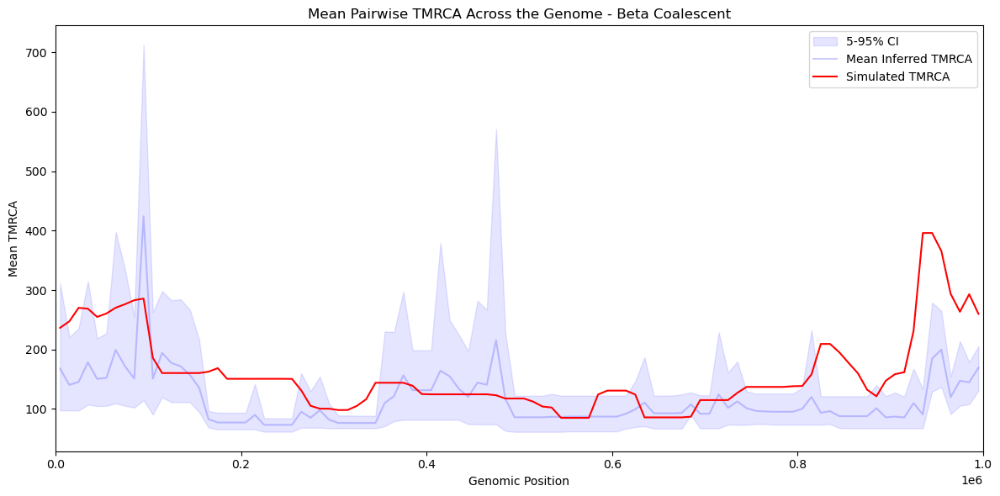

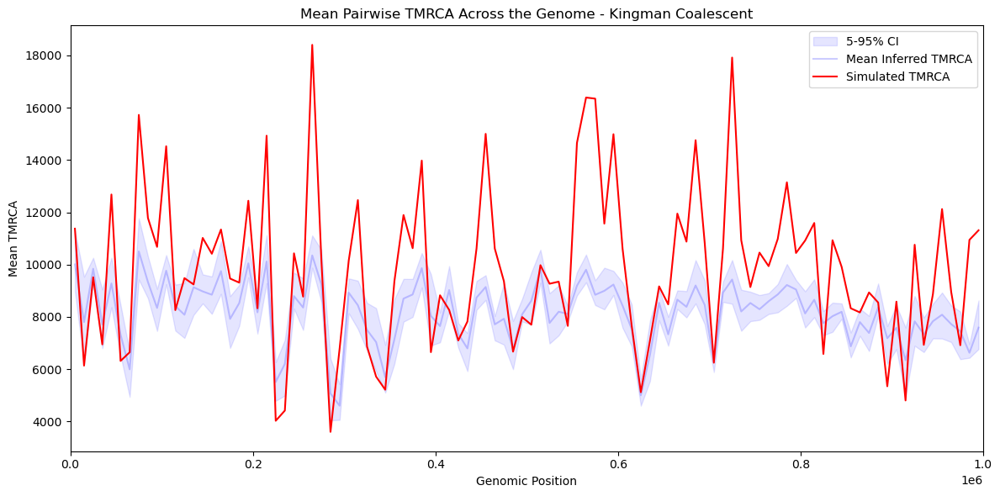

In [89]:


def plot_tmrca_cloud(pairwise_mean_tmrca_inferred_list, sequence_length, pairwise_tmrca_simulated, interval_size=10000, title=''):
    window_midpoints = np.arange(interval_size/2, sequence_length, interval_size)
    
    mean_pairwise_tmrca_inferred = np.mean(pairwise_mean_tmrca_inferred_list, axis=0)
    ci_lower = np.percentile(pairwise_mean_tmrca_inferred_list, 5, axis=0)
    ci_upper = np.percentile(pairwise_mean_tmrca_inferred_list, 95, axis=0)
    
    mean_pairwise_tmrca_simulated = np.mean(pairwise_tmrca_simulated, axis=1)

    plt.figure(figsize=(12, 6))
    
    plt.fill_between(window_midpoints, ci_lower, ci_upper, alpha=0.1, color='blue', label='5-95% CI')
    plt.plot(window_midpoints, mean_pairwise_tmrca_inferred, alpha=0.2, color='blue', label='Mean Inferred TMRCA')
    plt.plot(window_midpoints, mean_pairwise_tmrca_simulated, color='red', label='Simulated TMRCA')
    
    plt.title(f'Mean Pairwise TMRCA Across the Genome - {title}')
    plt.xlabel('Genomic Position')
    plt.ylabel('Mean TMRCA')
    plt.xlim(0, sequence_length)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Load simulated tree sequences
Beta_pairwise_coalescence_times_Sim,pairs_beta = compute_pairwise_coalescence_times(trees_file_sim_beta_const, interval_size)
Kingman_pairwise_coalescence_times_Sim, pairs_kingman = compute_pairwise_coalescence_times(trees_file_sim_kingman_const, interval_size)

interval_size = 10000

# Folders containing inferred tree files
folder_beta = "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/BetaCoal_Const_rep0_m1e-07_r5e-08_rs6.25"
folder_kingman = "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/KingmanConst_const_rep0_m1e-07_r5e-08_rs9.0"

# Process inferred trees
Beta_pairwise_mean_tmrca_inferred, sequence_length_beta = process_tree_files_pairwise(folder_beta, interval_size)
Kingman_pairwise_mean_tmrca_inferred, sequence_length_kingman = process_tree_files_pairwise(folder_kingman, interval_size)

# Compute mean of simulated TMRCA
mean_tmrca_simulated_beta = np.mean(Beta_pairwise_coalescence_times_Sim, axis=1)
mean_tmrca_simulated_kingman = np.mean(Kingman_pairwise_coalescence_times_Sim, axis=1)

# Plot the mean TMRCA with confidence interval for Beta coalescent
plot_tmrca_cloud(Beta_pairwise_mean_tmrca_inferred, sequence_length_beta, Beta_pairwise_coalescence_times_Sim, interval_size=10000, title='Beta Coalescent')

# Plot the mean TMRCA with confidence interval for Kingman coalescent
plot_tmrca_cloud(Kingman_pairwise_mean_tmrca_inferred, sequence_length_kingman, Kingman_pairwise_coalescence_times_Sim, interval_size=10000, title='Kingman Coalescent')

In [98]:
def pairwise_tmrcas_inferred(folder, interval_size=10000):
    pairwise_tmrca_list = []  # Store mean TMRCA values for all trees
    tree_files = [f for f in os.listdir(folder) if f.endswith('.trees')]  # Filter for .trees files
    
    for tree_file in tree_files:
        ts_inf = ts.load(os.path.join(folder, tree_file))
        
        # Compute pairwise coalescence times for this tree
        pairwise_coalescence_times, _ = compute_pairwise_coalescence_times(ts_inf, interval_size)
        
        # Calculate mean pairwise TMRCA for each window
        pairwise_tmrca_list.append(pairwise_coalescence_times)
    
    return pairwise_tmrca_list

all pairwise infrred tmrca

In [99]:
folder_beta = "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/BetaCoal_Const_rep0_m1e-07_r5e-08_rs6.25"
folder_kingman = "/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_trees_trials/Trees_different_demographies/outputs/KingmanConst_const_rep0_m1e-07_r5e-08_rs9.0"

Beta_pairwise_tmrcas_inferred=pairwise_tmrcas_inferred(folder_beta)
Kingman_pairwise_tmrcas_inferred=pairwise_tmrcas_inferred(folder_kingman)

Histograms of inferred vs simulated pairwise TMRCAs

In [111]:
#Simulated flattened
Beta_Sim_all_tmrca = Beta_pairwise_coalescence_times_Sim.flatten()
Kingman_Sim_all_tmrca = Kingman_pairwise_coalescence_times_Sim.flatten()


flat_Inf_Beta_pairwise_tmrca = np.concatenate(Beta_pairwise_tmrcas_inferred).flatten()
flat_Inf_Kingman_pairwise_tmrca = np.concatenate(Kingman_pairwise_tmrcas_inferred).flatten()


In [113]:
len(flat_Inf_Kingman_pairwise_tmrca)

190000

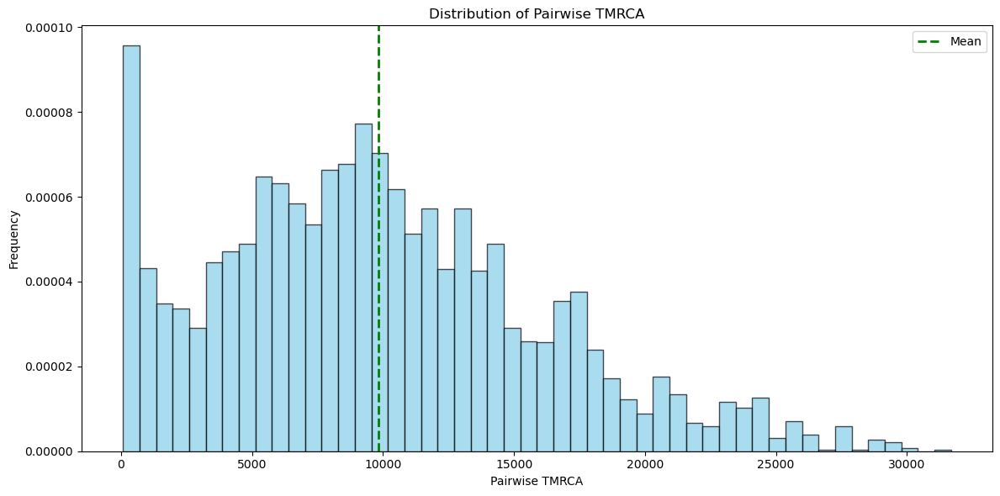

Mean TMRCA: 9819.260374023143
Median TMRCA: 9249.793718556726
Standard deviation of TMRCA: 6176.523099037837


In [97]:
# Assuming all_coalescence_times is your 2D array of pairwise TMRCA values

# Flatten the array to get all pairwise TMRCA values

Kingman_pairwise_tmrca_sim_flat = Kingman_pairwise_coalescence_times_Sim.flatten()

# Create the plot
plt.figure(figsize=(12, 6))

# Histogram
plt.hist(Kingman_pairwise_tmrca_sim_flat, bins=50, alpha=0.7, color='skyblue', edgecolor='black',density='True')
plt.title('Distribution of Pairwise TMRCA')
plt.xlabel('Pairwise TMRCA')
plt.ylabel('Frequency')


# Optional: Add vertical lines for mean and median
plt.axvline(np.mean(Kingman_pairwise_tmrca_sim_flat), color='green', linestyle='dashed', linewidth=2, label='Mean')

plt.legend()
plt.tight_layout()
plt.show()

# Print some summary statistics
print(f"Mean TMRCA: {np.mean(Kingman_pairwise_tmrca_sim_flat)}")
print(f"Median TMRCA: {np.median(Kingman_pairwise_tmrca_sim_flat)}")
print(f"Standard deviation of TMRCA: {np.std(Kingman_pairwise_tmrca_sim_flat)}")



# Create the plot
plt.figure(figsize=(12, 6))

# Histogram

plt.hist(flat_Inf_Kingman_pairwise_tmrca, bins=100, alpha=0.7, color='red', edgecolor='black',label="Inferred", density='True')
plt.title('Distribution of Pairwise TMRCA')
plt.xlabel('Pairwise TMRCA')
plt.ylabel('density')

# Assuming all_coalescence_times is your 2D array of pairwise TMRCA values

# Flatten the array to get all pairwise TMRCA values

Kingman_pairwise_tmrca_sim_flat = Kingman_pairwise_coalescence_times_Sim.flatten()

# Create the plot
plt.figure(figsize=(12, 6))

# Histogram
plt.hist(Beta_pairwise_tmrca_sim_flat, bins=50, alpha=0.7, color='skyblue', edgecolor='black',density='True')
plt.title('Distribution of Pairwise TMRCA')
plt.xlabel('Pairwise TMRCA')
plt.ylabel('Frequency')


# Optional: Add vertical lines for mean and median
plt.axvline(np.mean(Beta_pairwise_tmrca_sim_flat), color='green', linestyle='dashed', linewidth=2, label='Mean')

plt.legend()
plt.tight_layout()
plt.show()

# Print some summary statistics
print(f"Mean TMRCA: {np.mean(Kingman_pairwise_tmrca_sim_flat)}")
print(f"Median TMRCA: {np.median(Kingman_pairwise_tmrca_sim_flat)}")
print(f"Standard deviation of TMRCA: {np.std(Kingman_pairwise_tmrca_sim_flat)}")


        
flat_Inf_Beta_pairwise_tmrca = []
for row in Kingman_pairwise_coalescence_times_Sim:
         flat_Inf_Beta_pairwise_tmrca.extend(row)
# Assuming all_coalescence_times is your 2D array of pairwise TMRCA values



# Create the plot
plt.figure(figsize=(12, 6))

# Histogram

plt.hist(flat_Inf_Beta_pairwise_tmrca, bins=100, alpha=0.7, color='red', edgecolor='black',label="Inferred", density='True')
plt.title('Distribution of Pairwise TMRCA')
plt.xlabel('Pairwise TMRCA')
plt.ylabel('density')





KingmanPairwise TMRCA:
Simulated:
Mean: 9819.26
Median: 9249.79
Standard Deviation: 6176.52

Inferred:
Mean: 8159.94
Median: 9900.01
Standard Deviation: 5401.45

BetaPairwise TMRCA:
Simulated:
Mean: 159.22
Median: 96.30
Standard Deviation: 134.67

Inferred:
Mean: 115.77
Median: 87.97
Standard Deviation: 131.33


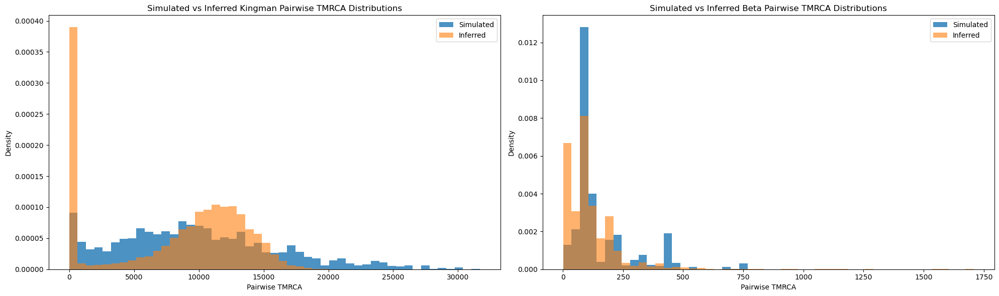

In [115]:

# Ensure all data is in numpy array format
Kingman_Sim_pairwise_tmrca = np.array(Kingman_Sim_all_tmrca)
flat_Inf_Kingman_pairwise_tmrca = np.array(flat_Inf_Kingman_pairwise_tmrca)
Beta_Sim_pairwise_tmrca = np.array(Beta_Sim_all_tmrca)
flat_Inf_Beta_pairwise_tmrca = np.array(flat_Inf_Beta_pairwise_tmrca)

# Create the figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Function to plot histogram and print statistics
def plot_and_print_stats(ax, sim_data, inf_data, title):
    min_val = min(sim_data.min(), inf_data.min())
    max_val = max(sim_data.max(), inf_data.max())
    bins = np.linspace(min_val, max_val, 50)
    
    ax.hist(sim_data, bins=bins, alpha=0.8, label="Simulated", density=True)
    ax.hist(inf_data, bins=bins, alpha=0.6, label="Inferred", density=True)
    
    ax.set_title(f"Simulated vs Inferred {title} Pairwise TMRCA Distributions")
    ax.set_xlabel("Pairwise TMRCA")
    ax.set_ylabel("Density")
    ax.legend()
    
    print(f"\n{title}Pairwise TMRCA:")
    print("Simulated:")
    print(f"Mean: {np.mean(sim_data):.2f}")
    print(f"Median: {np.median(sim_data):.2f}")
    print(f"Standard Deviation: {np.std(sim_data):.2f}")
    print("\nInferred:")
    print(f"Mean: {np.mean(inf_data):.2f}")
    print(f"Median: {np.median(inf_data):.2f}")
    print(f"Standard Deviation: {np.std(inf_data):.2f}")

# Plot Kingman coalescent
plot_and_print_stats(ax1, Kingman_Sim_pairwise_tmrca, flat_Inf_Kingman_pairwise_tmrca, "Kingman")

# Plot Beta coalescent
plot_and_print_stats(ax2, Beta_Sim_all_tmrca, flat_Inf_Beta_pairwise_tmrca, "Beta")

plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Ensure all data is in numpy array format
Kingman_Sim_all_tmrca = np.array(Kingman_Sim_all_tmrca)
flat_Inf_Kingman_all_tmrca = np.array(flat_Inf_Kingman_all_tmrca)
Beta_Sim_all_tmrca = np.array(Beta_Sim_all_tmrca)
flat_Inf_Beta_all_tmrca = np.array(flat_Inf_Beta_all_tmrca)

# Create the figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 6))

# Function to plot histogram and print statistics
def plot_and_print_stats(ax, sim_data, inf_data, title):
    min_val = min(sim_data.min(), inf_data.min())
    max_val = max(sim_data.max(), inf_data.max())
    bins = np.linspace(min_val, max_val, 50)
    
    ax.hist(sim_data, bins=bins, alpha=0.5, label="Simulated", density=True)
    ax.hist(inf_data, bins=bins, alpha=0.5, label="Inferred", density=True)
    
    ax.set_title(f"Simulated vs Inferred {title} TMRCA Distributions")
    ax.set_xlabel("TMRCA")
    ax.set_ylabel("Density")
    ax.legend()
    
    print(f"\n{title} TMRCA:")
    print("Simulated:")
    print(f"Mean: {np.mean(sim_data):.2f}")
    print(f"Median: {np.median(sim_data):.2f}")
    print(f"Standard Deviation: {np.std(sim_data):.2f}")
    print("\nInferred:")
    print(f"Mean: {np.mean(inf_data):.2f}")
    print(f"Median: {np.median(inf_data):.2f}")
    print(f"Standard Deviation: {np.std(inf_data):.2f}")

# Plot Kingman coalescent
plot_and_print_stats(ax1, Kingman_Sim_all_tmrca, flat_Inf_Kingman_all_tmrca, "Kingman")

# Plot Beta coalescent
plot_and_print_stats(ax2, Beta_Sim_all_tmrca, flat_Inf_Beta_all_tmrca, "Beta")

plt.tight_layout()
plt.show()

In [ ]:

# Plot heatmap of pairwise coalescence times
plt.figure(figsize=(12, 10))
sns.heatmap(all_coalescence_times.T, cmap='viridis', xticklabels=50, yticklabels=False)
plt.title('Pairwise Coalescence Times Across the Genome')
plt.xlabel(f'Genomic Position ({interval_size} bp windows)')
plt.ylabel('Sample Pairs')
cbar = plt.colorbar(label='Coalescence Time')
cbar.set_label('Coalescence Time', rotation=270, labelpad=15)

# Add pair labels to y-axis
plt.yticks(np.arange(len(pairs)) + 0.5, [f'{p[0]}_{p[1]}' for p in pairs], rotation=0, fontsize=8)

plt.tight_layout()
plt.show()

# Plot mean coalescence time across the genome
mean_coalescence_time = np.mean(all_coalescence_times, axis=1)
plt.figure(figsize=(12, 6))
plt.plot(np.arange(0, ts.sequence_length, interval_size), mean_coalescence_time)
plt.title('Mean Pairwise Coalescence Time Across the Genome')
plt.xlabel('Genomic Position')
plt.ylabel('Mean Coalescence Time')
plt.tight_layout()
plt.show()

# Save results to CSV with indices separated by '_'
df = pd.DataFrame(all_coalescence_times)
pair_labels = [f"{i[0]}_{i[1]}" for i in pairs]
df.columns = pair_labels
df.to_csv('coalescence_times.csv', index=False)

# Also save the genomic positions
positions = np.arange(0, ts.sequence_length, interval_size)
df_with_positions = pd.DataFrame({'Position': positions})
df_with_positions = pd.concat([df_with_positions, df], axis=1)
df_with_positions.to_csv('coalescence_times_with_positions.csv', index=False)


In [ ]:
# Assuming all_coalescence_times is your 2D array of pairwise TMRCA values

# Flatten the array to get all pairwise TMRCA values
all_tmrca = all_coalescence_times_Sim.flatten()

# Remove any potential infinite or NaN values
all_tmrca = all_tmrca[np.isfinite(all_tmrca)]

# Create the plot
plt.figure(figsize=(12, 6))

# Histogram
plt.hist(all_tmrca, bins=50, alpha=0.7, color='skyblue', edgecolor='black')
plt.title('Distribution of Pairwise TMRCA')
plt.xlabel('Pairwise TMRCA')
plt.ylabel('Frequency')


# Optional: Add vertical lines for mean and median
plt.axvline(np.mean(all_tmrca), color='green', linestyle='dashed', linewidth=2, label='Mean')

plt.legend()
plt.tight_layout()
plt.show()

# Print some summary statistics
print(f"Mean TMRCA: {np.mean(all_tmrca)}")
print(f"Median TMRCA: {np.median(all_tmrca)}")
print(f"Standard deviation of TMRCA: {np.std(all_tmrca)}")

In [7]:
import pickle
import tskit

In [12]:
def compute_all_coalescence_times(trees):
    """Compute pairwise coalescence times."""
    kb = [0]  # Starting genomic position
    mrca_time = []
    for tree in trees.trees():
        kb.append(tree.interval.right / 1000)  # convert to kb
        mrca = trees.node(tree.root)  # For msprime tree sequences, the root node is the MRCA
        mrca_time.append((mrca.time))
    return np.array(mrca_time)

def process_trees_file(file_path):
    """Process a single .trees file to compute TMRCA."""
    try:
        trees = tskit.load(file_path)  # Load the tree sequence from the .trees file
        return compute_all_coalescence_times(trees)
    except Exception as e:
        print(f"Error processing {file_path}: {e}")
        return None


In [13]:
tmrca_list=[]
# Recursively collate TMRCA from all .trees files in the directory
for root, dirs, files in os.walk('/data/proj2/home/students/u.srinivasan/Plasmodium_us/Inputs/msprime_sims/SINGER_in_out/Consant_pop_size/beta_10/m1e-4/alpha1.3'):
        for file in files:
            if file.endswith('.ts'):
                file_path = os.path.join(root, file)
                tmrca_array = process_trees_file(file_path)
                if tmrca_array is not None:
                    tmrca_list.append(tmrca_array)

In [14]:

    
 # Combine all TMRCA results into a single array
tmrca_distribution = np.concatenate(tmrca_list) if tmrca_list else np.array([])



In [15]:
tmrca_distribution

array([194.60789875, 194.60789875, 194.60789875, ..., 118.24082034,
       150.18893817,   0.84278016])

In [ ]:
# Save the distribution to a .pkl file
with open(output_file, 'wb') as f:
        pickle.dump(tmrca_distribution, f)

print(f"TMRCA distribution saved to {output_file}")
